# **Capstone Project 1**

## **Basic Libraries and Functions**

In [1]:
# Basic Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler

# Models
from sklearn.ensemble import GradientBoostingRegressor ,AdaBoostRegressor,RandomForestRegressor,BaggingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

# Metrics
from sklearn.metrics import confusion_matrix

# Preprocessing tools
from sklearn.model_selection import train_test_split
from math import radians, sin, cos, sqrt, atan2
import sklearn.model_selection
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

# Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# For returning lower and upper value beyond which the values are considered outliers
def remove_outlier(col_1):
  sorted(col_1)
  q1,q3 = col_1.quantile([0.25,0.75])
  IQR = q3 - q1
  lower_value = q1 - (1.5*IQR)
  upper_value = q3 + (1.5*IQR)
  return lower_value,upper_value

In [3]:
# For removing outliers from all float and integer columns of dataframe(only used int64 or float64 as they were the only ones in dataset which required purification)
def data_pure(df):
  for col in df.columns:
    if(df[col].dtype == 'int64' or df[col].dtype == 'float64'):
      lower_col,upper_col = remove_outlier(df[col])
      df[col] = np.where(df[col] > upper_col,upper_col,df[col])
      df[col] = np.where(df[col] < lower_col,lower_col,df[col])

In [4]:
# For finding distance using latitude and longitude of pick up and drop off
def haversine(lat1, lon1, lat2, lon2):
    # Radius of the Earth in kilometers
    R = 6371.0

    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    # Distance in kilometers
    distance = R * c
    return distance

In [5]:
# Setting theme
sns.set_theme(palette='tab10',
              font_scale=1.0)
import matplotlib
matplotlib.rcParams.update({'font.size':10})
plt.style.use('dark_background')

## **Data Import and Preprocessing**

In [6]:
# Reading the csv file and storing it in df dataframe
df = pd.read_csv("/content/TaxiFare.csv")
amount_before_pure = df['amount']

### **Data Dimensionality Reduction**

⭐ **Note:**
* Latitude and longitude of pick up and drop off can be combined to give the total distance travelled and can be replaced by it.
* This leads to replacement of 4 columns by a single column hence leading to reduced dimensionality of input data.

In [7]:
# Calculate distance and create a new column 'distance_km'
df['distance_km'] = df.apply(
    lambda row: haversine(row['latitude_of_pickup'], row['longitude_of_pickup'],
                          row['latitude_of_dropoff'], row['longitude_of_dropoff']),
    axis=1
)

# Dropping Latitide and longitude of pick up and drop off
df = df.drop(['latitude_of_pickup','longitude_of_pickup','latitude_of_dropoff','longitude_of_dropoff'],axis=1)

distance_before_pure = df['distance_km']

### **Data Visualization and Purification**

#### Before Purification

In [8]:
df.sample(10).style.background_gradient(cmap='coolwarm')

,unique_id,amount,date_time_of_pickup,no_of_passenger,distance_km
11971,57:33.0,33.330000,2015-02-06 11:57:33 UTC,1,10.601792
1524,53:00.0,19.500000,2013-09-19 07:53:00 UTC,1,6.702584
30064,49:10.0,6.100000,2009-04-19 17:49:10 UTC,1,1.469689
16084,45:21.0,6.900000,2011-11-01 11:45:21 UTC,4,2.399354
46971,21:01.0,7.000000,2012-09-10 19:21:01 UTC,1,1.105395
45980,44:57.0,4.100000,2012-06-27 09:44:57 UTC,1,0.807283
30140,22:40.0,10.100000,2009-06-05 20:22:40 UTC,1,4.278840
3224,34:00.0,8.900000,2010-07-08 13:34:00 UTC,1,2.294498
9303,52:00.0,8.500000,2011-08-17 19:52:00 UTC,2,3.201276
42905,11:00.0,7.500000,2013-11-12 22:11:00 UTC,2,19.839088


In [9]:
# Checking for datatype of all columns and checking for missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   unique_id            50000 non-null  object 
 1   amount               50000 non-null  float64
 2   date_time_of_pickup  50000 non-null  object 
 3   no_of_passenger      50000 non-null  int64  
 4   distance_km          50000 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 1.9+ MB


In [10]:
# Checking for any null values in data
df.isnull().sum()

unique_id              0
amount                 0
date_time_of_pickup    0
no_of_passenger        0
distance_km            0
dtype: int64

In [11]:
# For checking frequency of all values in all columns
for y,x in enumerate(df.columns):
  print(df[x].value_counts())

26:00.0    457
33:00.0    439
11:00.0    436
32:00.0    429
20:00.0    424
          ... 
56:16.0      1
40:52.0      1
53:10.0      1
15:21.0      1
53:22.0      1
Name: unique_id, Length: 3597, dtype: int64
6.50     2468
4.50     2104
8.50     1929
6.10     1441
5.30     1440
         ... 
26.60       1
25.39       1
55.83       1
30.04       1
27.05       1
Name: amount, Length: 703, dtype: int64
2011-09-03 01:30:00 UTC    3
2014-05-30 23:38:00 UTC    3
2012-06-28 20:54:00 UTC    3
2011-02-11 13:19:00 UTC    3
2014-05-30 10:50:00 UTC    2
                          ..
2011-10-07 00:24:25 UTC    1
2015-04-02 06:47:05 UTC    1
2011-01-09 10:09:58 UTC    1
2012-10-27 18:11:00 UTC    1
2010-01-13 08:13:14 UTC    1
Name: date_time_of_pickup, Length: 49555, dtype: int64
1    34808
2     7386
5     3453
3     2183
4     1016
6      989
0      165
Name: no_of_passenger, dtype: int64
0.000000    1449
1.030764       1
1.170615       1
6.246396       1
1.264642       1
            ... 
3.120250

⭐ **Note:**
* The frequency table for no_of_passenger columns is given by:
   * 0  -  165
   * 1   - 34808
   * 2  -  7386
   * 3  -  2183
   * 4  -  1016
   * 5  -  3453
   * 6  -  989
   
* Since we can see no_of_passengers column has discrete values, it can be considered as categorical variable.   
* All other columns with integer or float data type have continuous values (amount and distance_km)

In [12]:
df.sample(10).style.background_gradient(cmap='coolwarm')

,unique_id,amount,date_time_of_pickup,no_of_passenger,distance_km
10854,42:46.0,14.000000,2015-05-30 03:42:46 UTC,2,5.524219
46388,07:00.0,8.000000,2014-02-07 22:07:00 UTC,2,2.166854
18082,33:00.0,6.100000,2012-07-01 05:33:00 UTC,1,1.740035
16730,18:00.0,5.000000,2014-03-01 13:18:00 UTC,6,0.906453
21532,15:00.0,15.300000,2011-10-08 22:15:00 UTC,1,5.913128
2252,27:29.0,4.900000,2009-01-15 13:27:29 UTC,1,1.332016
34749,54:47.0,8.500000,2015-03-31 21:54:47 UTC,2,1.976163
48329,47:00.0,3.700000,2012-04-21 23:47:00 UTC,3,0.543256
3099,54:57.0,4.500000,2010-09-19 20:54:57 UTC,4,1.032340
1340,23:16.0,10.100000,2010-04-30 07:23:16 UTC,1,3.938006


In [13]:
df.describe().style.background_gradient(cmap='rainbow')

,amount,no_of_passenger,distance_km
count,50000.000000,50000.000000,50000.000000
mean,11.364171,1.667840,18.508946
std,9.685557,1.289195,355.564309
min,-5.000000,0.000000,0.000000
25%,6.000000,1.000000,1.223146
50%,8.500000,1.000000,2.120114
75%,12.500000,2.000000,3.895570
max,200.000000,6.000000,8667.818812


<Axes: >

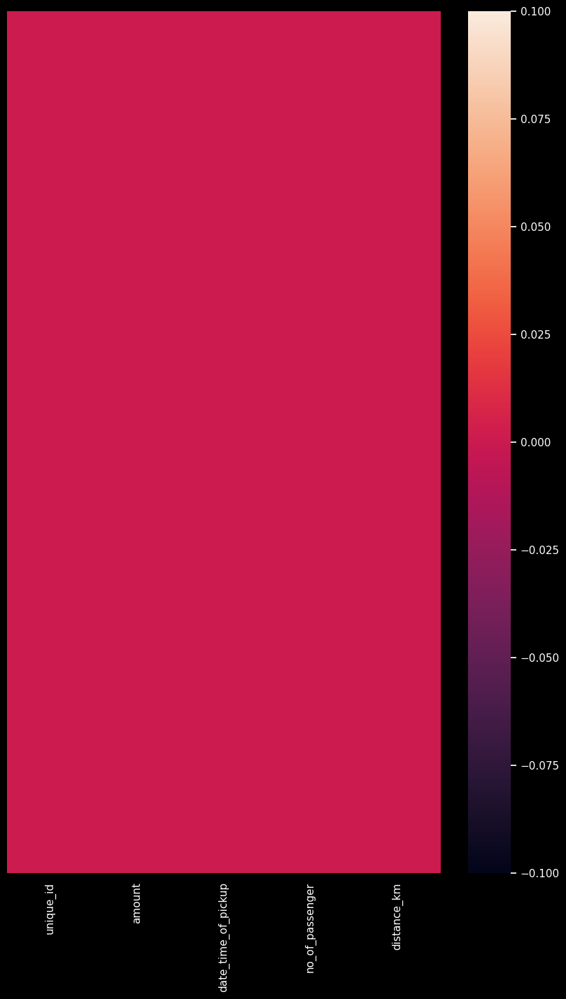

In [14]:
plt.figure(figsize=(10,16))
sns.heatmap(df.isnull(),yticklabels=False)

<Axes: >

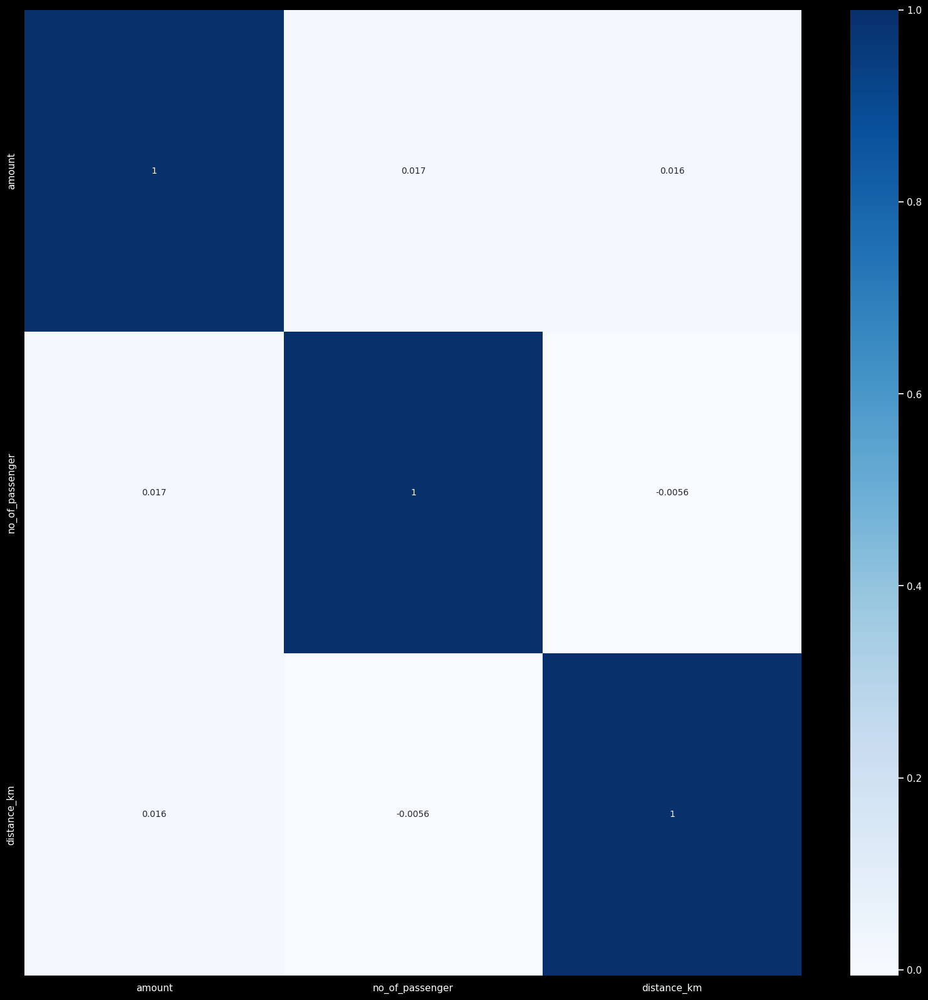

In [15]:
# Correlation matrix of impure data
correlation_mat = df.corr()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(correlation_mat, annot=True, linewidths=0, ax=ax,cmap='Blues')

array([[<Axes: title={'center': 'amount'}>,
        <Axes: title={'center': 'no_of_passenger'}>],
       [<Axes: title={'center': 'distance_km'}>, <Axes: >]], dtype=object)

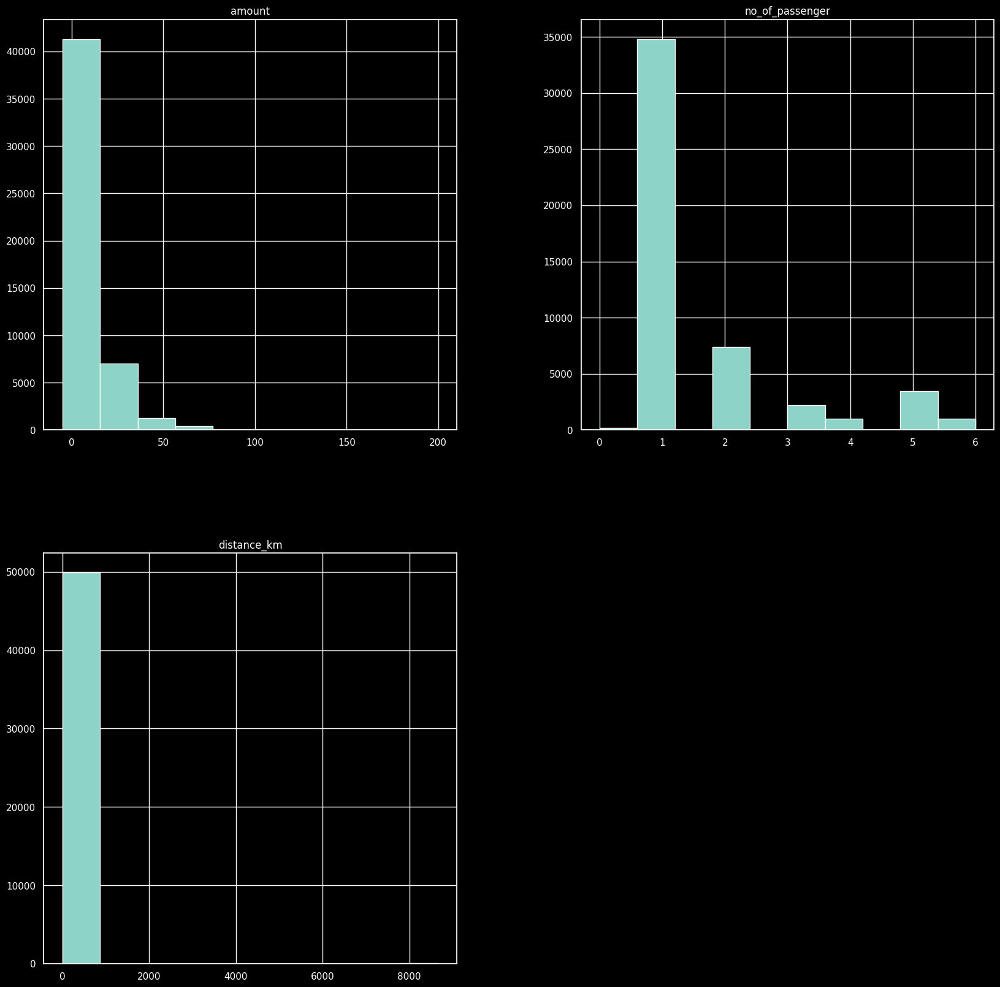

In [16]:
# DataFrame representation without purification
df.hist(figsize=(20,20))

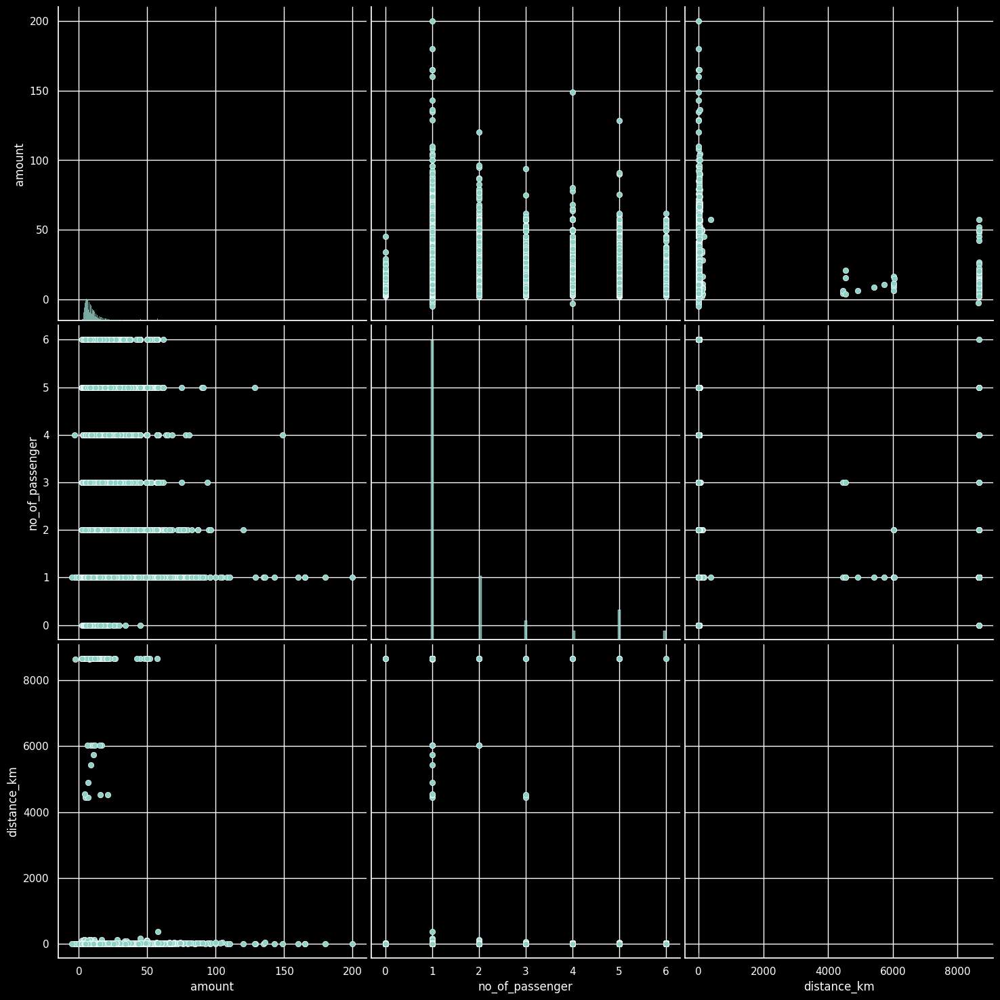

In [17]:
# For finding the distribution of all variables with respect to all other variables
sns.pairplot(df,height=5)

#### After Purification

In [18]:
# For removal of outliers from all float or int columns of df dataframe
data_pure(df)

* Considering all continuous, float/integer data type columns that is amount and distance_km column for analysis of purified data

In [19]:
# For finding the limits of value of amount column beyond which values are considered outlier
lower_amount,upper_amount = remove_outlier(df['amount'])
print(f'Lower limit for amount - : {lower_amount:.5f} dollars')
print(f'Upper limit for amount - : {upper_amount:.5f} dollars')

Lower limit for amount - : -3.75000 dollars
Upper limit for amount - : 22.25000 dollars


<Axes: title={'center': 'Actual Taxi Fare'}, xlabel='amount'>

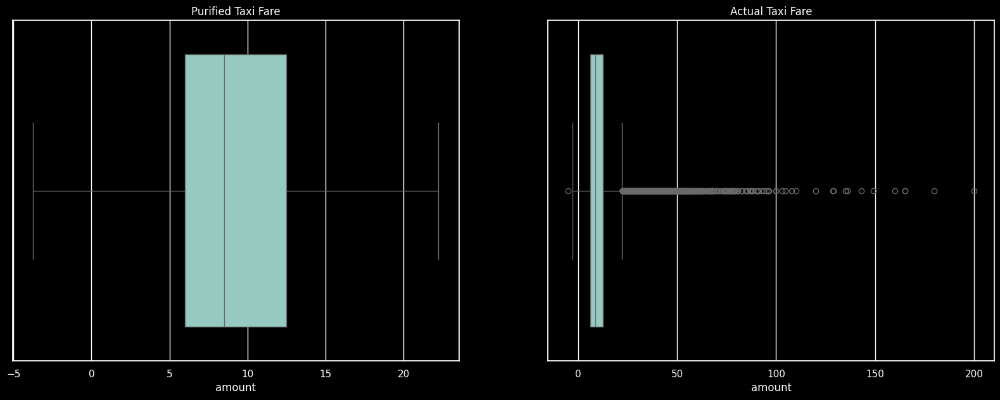

In [20]:
# For comparing the purified and actual taxi fare
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Purified Taxi Fare')
sns.boxplot(x=df['amount'])
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.boxplot(x = amount_before_pure)

<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

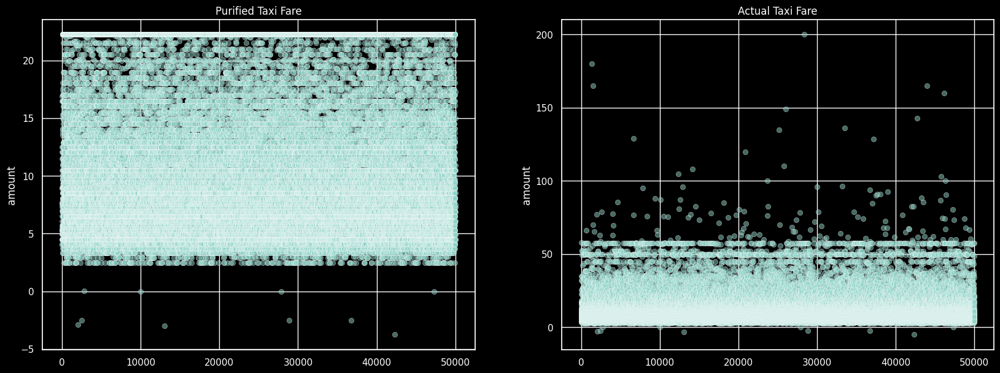

In [21]:
# For comparing the purified and actual taxi fare
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Purified Taxi Fare')
sns.scatterplot(df['amount'],alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(amount_before_pure,alpha=0.5)


* As we can observe all the data in amount column is now limited to the range of -3.75 to 22.25 hence all outliers are removed

In [22]:
# For finding the limits of value of distance_km column beyond which values are considered outlier
lower_amount,upper_amount = remove_outlier(df['distance_km'])
print(f'Lower limit for amount - : {lower_amount:.5f} km')
print(f'Upper limit for amount - : {upper_amount:.5f} km')

Lower limit for amount - : -2.78549 km
Upper limit for amount - : 7.90421 km


<Axes: title={'center': 'Actual Distance (KM)'}, xlabel='distance_km'>

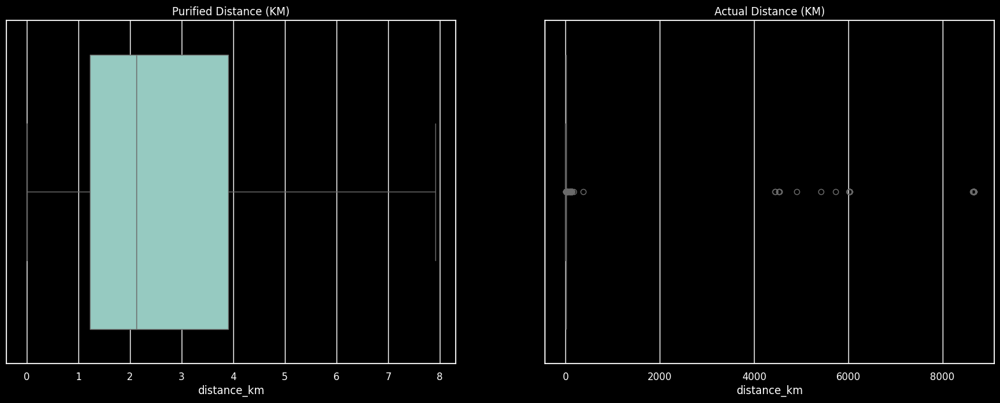

In [23]:
# For comparing the purified and actual distance in km
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Purified Distance (KM)')
sns.boxplot(x= df['distance_km'])
plt.subplot(1,2,2)
plt.title('Actual Distance (KM)')
sns.boxplot(x= distance_before_pure)

<Axes: title={'center': 'Actual Distance (KM)'}, ylabel='distance_km'>

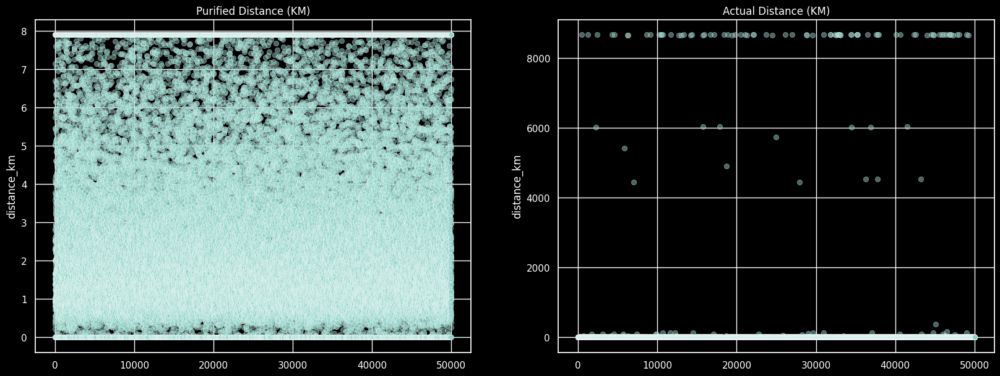

In [24]:
# For comparing the purified and actual distance in km
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Purified Distance (KM)')
sns.scatterplot(df['distance_km'],alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Distance (KM)')
sns.scatterplot(distance_before_pure,alpha=0.5)

* As we can observe all the data in distance_km column is now limited to the range of -2.78549 to 7.90421 hence all outliers are removed

<Axes: >

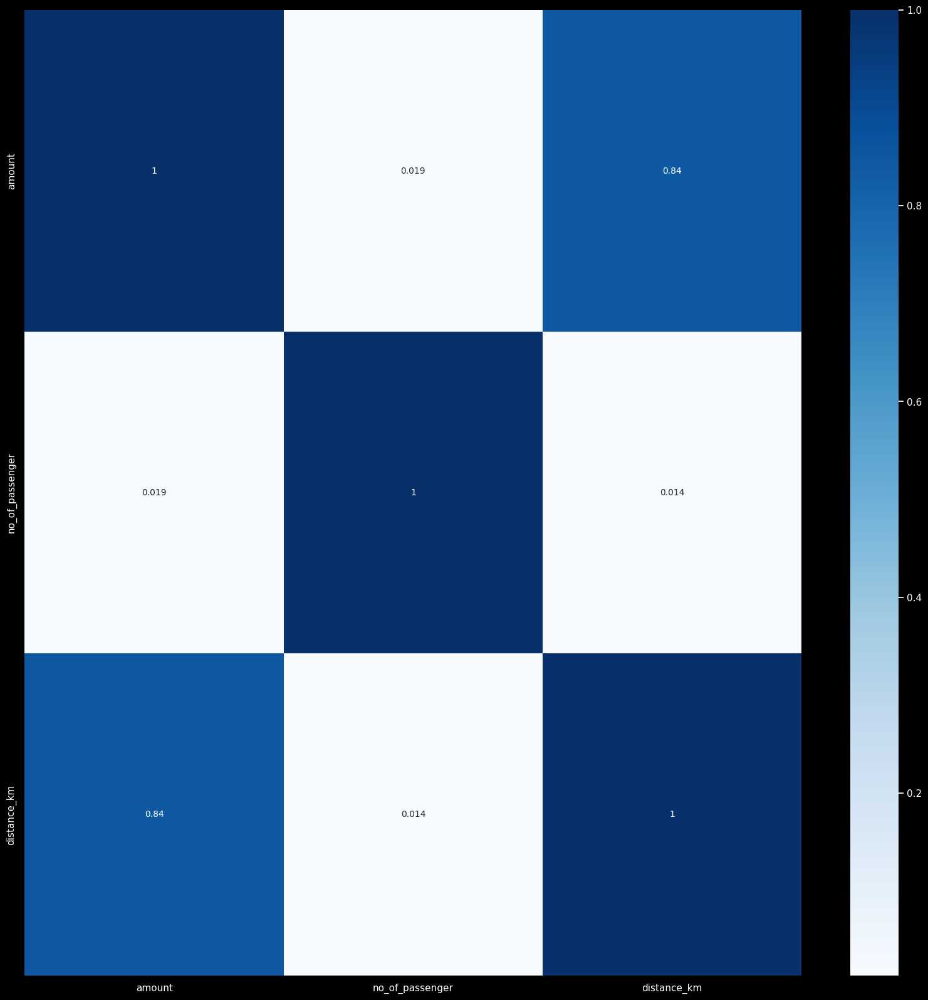

In [25]:
# Correlation matrix for purified data
correlation_mat = df.corr()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(correlation_mat, annot=True, linewidths=0, ax=ax,cmap='Blues')

* Hence we can see that after removing outliers from amount and distance_km column they have become more correlated leading better model performance

array([[<Axes: title={'center': 'amount'}>,
        <Axes: title={'center': 'no_of_passenger'}>],
       [<Axes: title={'center': 'distance_km'}>, <Axes: >]], dtype=object)

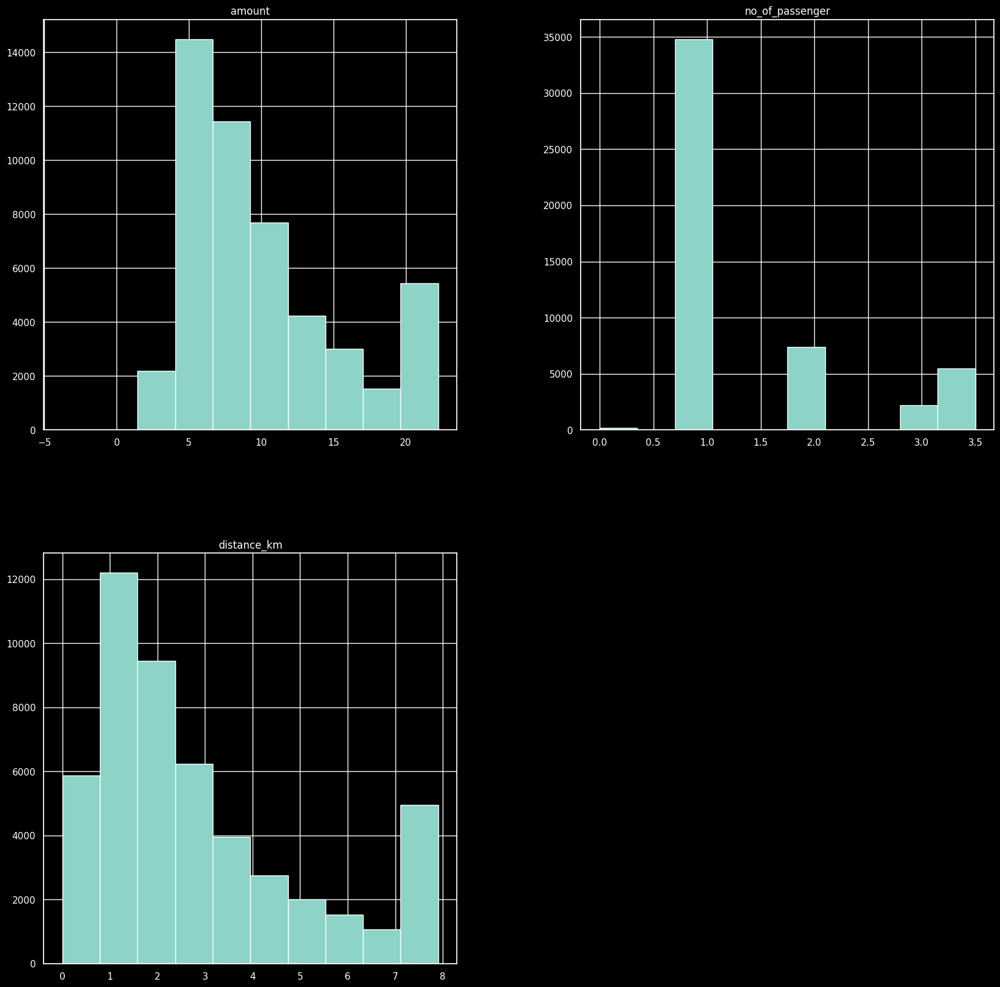

In [26]:
# DataFrame representation with purification
df.hist(figsize=(20,20))

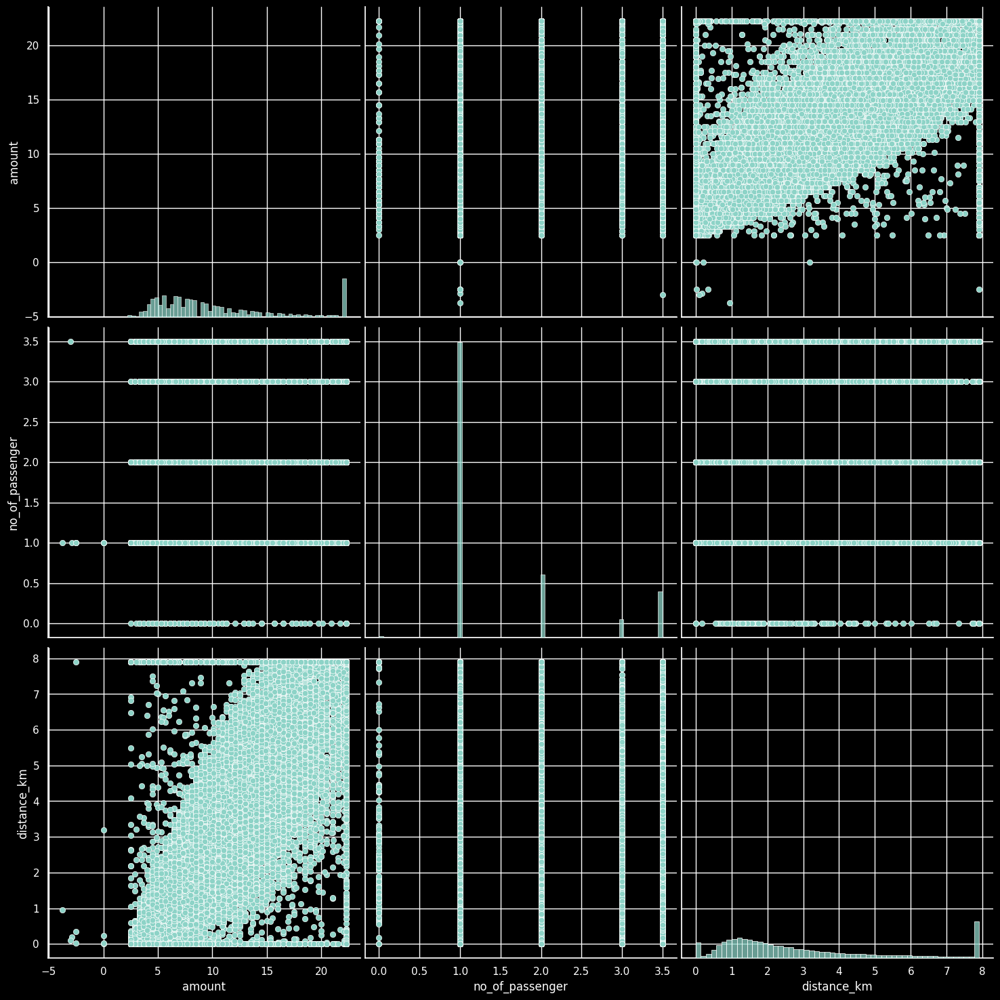

In [27]:
# For finding the distribution of all variables with respect to all other variables for purified data
sns.pairplot(df,height=5)

### **Data Encoding**

In [28]:
# For encoding date-time into float format
df['date_time_of_pickup'] = pd.to_datetime(df['date_time_of_pickup'])
df['timestamp'] = df['date_time_of_pickup'].apply(lambda x: x.timestamp())
df = df.drop('date_time_of_pickup',axis=1)

In [29]:
# For encoding rest of the object type columns into float format
for col in df.columns:
  if(df[col].dtype != 'int64' and df[col].dtype != 'float64'):
    df[col] = le.fit_transform(df[col])

### **Data Split and Standardization**

In [30]:
# Splitting dataframe into test and train data
X = df.drop('amount',axis=1)
Y = df['amount']

X_train,X_test,Y_train,Y_test= train_test_split(X,Y,test_size = 0.20,random_state=1)

In [31]:
# Standardizing Data for better model performance
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [32]:
# Encoded and Standardized DataFrame
df.sample(10).style.background_gradient(cmap='coolwarm')

,unique_id,amount,no_of_passenger,distance_km,timestamp
31044,3357,3.700000,1.000000,0.831095,1302033360.000000
37208,2097,10.100000,1.000000,2.747022,1318710900.000000
30445,3117,5.700000,2.000000,1.623961,1279176720.000000
28503,1269,11.500000,3.500000,1.689271,1429222871.000000
40325,2727,4.500000,1.000000,0.906500,1400697930.000000
9797,3177,10.500000,1.000000,1.874224,1415476380.000000
28630,2678,8.100000,1.000000,1.284936,1299843881.000000
28525,1635,7.000000,1.000000,1.729393,1357464437.000000
48559,2517,9.300000,1.000000,2.963789,1278970920.000000
26623,300,21.500000,1.000000,4.616136,1356357900.000000


## **Models**

### **Linear Regressor**

#### Without Tuning

In [33]:
# Initializing and fitting untuned model
model_lr = LinearRegression()
model_lr.fit(X_train,Y_train)

LinearRegression()

In [34]:
# Predicting the target variable
y_pred_test = model_lr.predict(X_test)
y_pred_train = model_lr.predict(X_train)

In [35]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_test):.5f}')

Train MAE - : 1.88933
Test MAE - : 1.89101


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

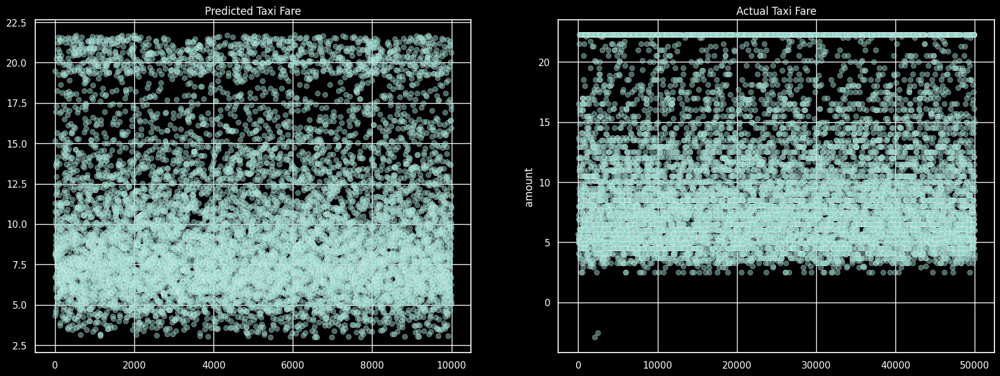

In [36]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning


In [37]:
param_grid_lr = {'fit_intercept': [True, False],
              'positive': [True, False],
              'copy_X': [True, False]}

# Create the RandomizedSearchCV object
lr_RandomGrid = RandomizedSearchCV(model_lr,
                           param_grid_lr,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')

# Fit the model to the data
lr_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END .....copy_X=True, fit_intercept=True, positive=True; total time=   0.0s
[CV] END .....copy_X=True, fit_intercept=True, positive=True; total time=   0.0s
[CV] END .....copy_X=True, fit_intercept=True, positive=True; total time=   0.0s
[CV] END .....copy_X=True, fit_intercept=True, positive=True; total time=   0.0s
[CV] END .....copy_X=True, fit_intercept=True, positive=True; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=True, positive=False; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=True, positive=False; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=True, positive=False; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=True, positive=False; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=True, positive=False; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=False, positive=True; total time=   0.0s
[CV] END ....copy_X=True, fit_intercept=False, po

RandomizedSearchCV(cv=5, estimator=LinearRegression(),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'positive': [True, False]},
                   scoring='neg_mean_squared_error', verbose=2)

In [38]:
# The best values of hyperparameters
lr_RandomGrid.best_params_

{'positive': True, 'fit_intercept': True, 'copy_X': True}

In [39]:
# The best model
lr_RandomGrid.best_estimator_

LinearRegression(positive=True)

In [40]:
# Predicting the target variable
y_pred_test_tuned = lr_RandomGrid.predict(X_test)
y_pred_train_tuned = lr_RandomGrid.predict(X_train)

In [41]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_test_tuned):.5f}')

Train MAE - : 1.88924
Test MAE - : 1.89086


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

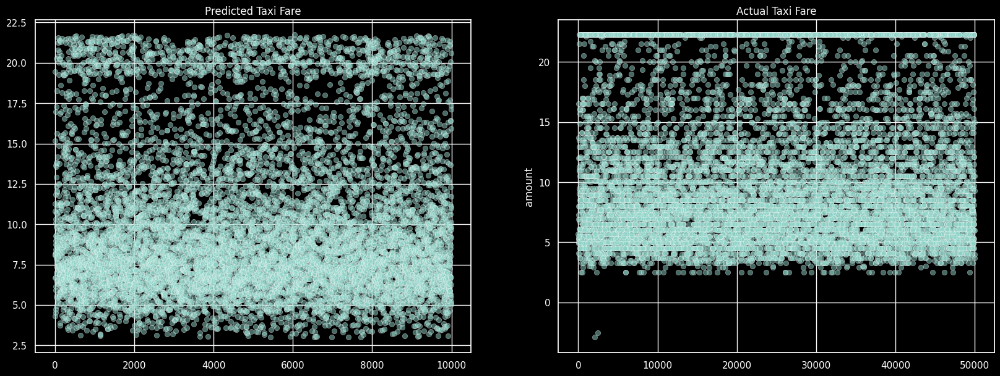

In [42]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **SVR**

#### Without Tuning

In [43]:
# Initializing and fitting untuned model
model_sv = SVR()
model_sv.fit(X_train,Y_train)

SVR()

In [44]:
# Predicting the target variable
y_pred_sv_test = model_sv.predict(X_test)
y_pred_sv_train = model_sv.predict(X_train)

In [45]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train,y_pred_sv_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_sv_test):.5f}')

Train MAE - : 1.65224
Test MAE - : 1.64911


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

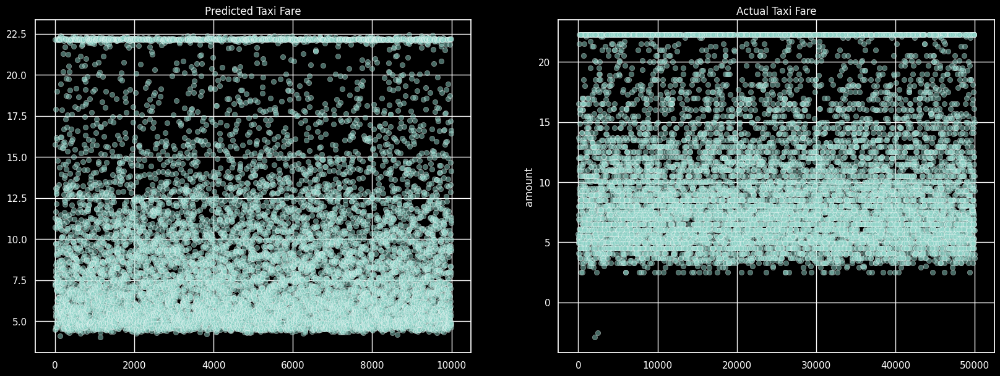

In [46]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_sv_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [47]:
param_grid_sv = {'C': [1e-2, 1e-1, 1, 10, 100],
              'gamma': [1e-2, 1e-1, 1, 10, 100]}

# Create the RandomizedSearchCV object
svr_RandomGrid = RandomizedSearchCV(model_sv,
                           param_grid_sv,
                           cv=2, # Less cross validation steps due to large execution time per epoch
                           verbose=2,
                           scoring='neg_mean_squared_error')

# Fit the model to the data
svr_RandomGrid.fit(X_train,Y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV] END ...................................C=10, gamma=0.01; total time=  40.2s
[CV] END ...................................C=10, gamma=0.01; total time=  39.3s
[CV] END ...................................C=0.01, gamma=10; total time=  49.3s
[CV] END ...................................C=0.01, gamma=10; total time=  50.4s
[CV] END ...................................C=100, gamma=100; total time= 6.0min
[CV] END ...................................C=100, gamma=100; total time= 5.9min
[CV] END ...................................C=100, gamma=0.1; total time=  52.3s
[CV] END ...................................C=100, gamma=0.1; total time=  54.3s
[CV] END .......................................C=1, gamma=1; total time=  39.7s
[CV] END .......................................C=1, gamma=1; total time=  38.6s
[CV] END .....................................C=1, gamma=0.1; total time=  38.1s
[CV] END .....................................C=

RandomizedSearchCV(cv=2, estimator=SVR(),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100],
                                        'gamma': [0.01, 0.1, 1, 10, 100]},
                   scoring='neg_mean_squared_error', verbose=2)

In [48]:
# The best values of hyperparameters
svr_RandomGrid.best_params_

{'gamma': 1, 'C': 1}

In [49]:
# The best model
svr_RandomGrid.best_estimator_

SVR(C=1, gamma=1)

In [50]:
# Predicting the target variable
y_pred_sv_test_tuned = svr_RandomGrid.predict(X_test)
y_pred_sv_train_tuned = svr_RandomGrid.predict(X_train)

In [51]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_sv_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_sv_test_tuned):.5f}')

Train MAE - : 1.61835
Test MAE - : 1.63358


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

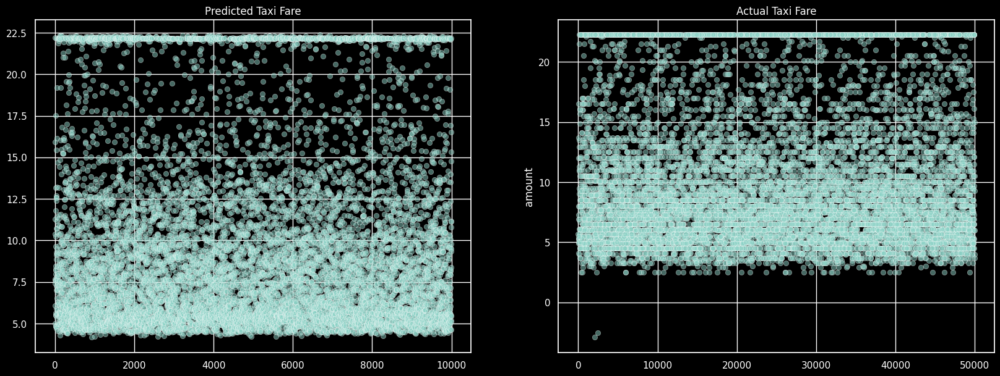

In [52]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_sv_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **Decision Tree Regression**

#### Without Tuning

In [53]:
# Initializing and fitting untuned model
model_dt = DecisionTreeRegressor()
model_dt.fit(X_train,Y_train)

DecisionTreeRegressor()

In [54]:
# Predicting the target variable
y_pred_dt_test = model_dt.predict(X_test)
y_pred_dt_train = model_dt.predict(X_train)

In [55]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_dt_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_dt_test):.5f}')

Train MAE - : 0.00000
Test MAE - : 2.38841


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

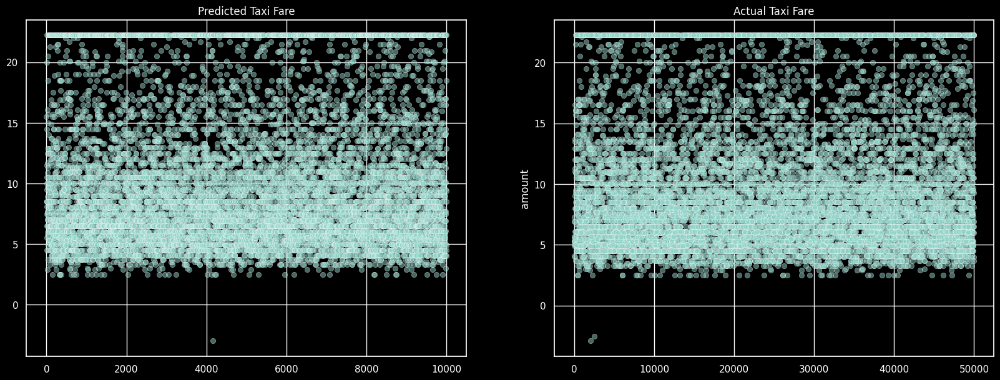

In [56]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_dt_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [57]:
param_grid_dt = {
    'max_depth': [1, 5, 10, 20, 50, 100, 200],
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': ['auto', 'sqrt', 'log2', None] + list(np.arange(0.1, 1.1, 0.1))
}

# Create the RandomizedSearchCV object
dt_RandomGrid = RandomizedSearchCV(model_dt,
                           param_grid_dt,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')
# Fit the grid to the data
dt_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=5, max_features=0.4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END max_depth=5, max_features=0.4,

RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(),
                   param_distributions={'max_depth': [1, 5, 10, 20, 50, 100,
                                                      200],
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None, 0.1, 0.2,
                                                         0.30000000000000004,
                                                         0.4, 0.5, 0.6,
                                                         0.7000000000000001,
                                                         0.8, 0.9, 1.0],
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10])},
                   scoring='neg_mean_squared_error', verbose=2)

In [58]:
# The best values of hyperparameters
dt_RandomGrid.best_params_

{'min_samples_split': 4,
 'min_samples_leaf': 6,
 'max_features': 0.9,
 'max_depth': 10}

In [59]:
# The best model
dt_RandomGrid.best_estimator_

DecisionTreeRegressor(max_depth=10, max_features=0.9, min_samples_leaf=6,
                      min_samples_split=4)

In [60]:
# Predicting the target variable
y_pred_dt_test_tuned = dt_RandomGrid.predict(X_test)
y_pred_dt_train_tuned = dt_RandomGrid.predict(X_train)

In [61]:
# Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_dt_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_dt_test_tuned):.5f}')

Train MAE - : 1.61884
Test MAE - : 1.75927


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

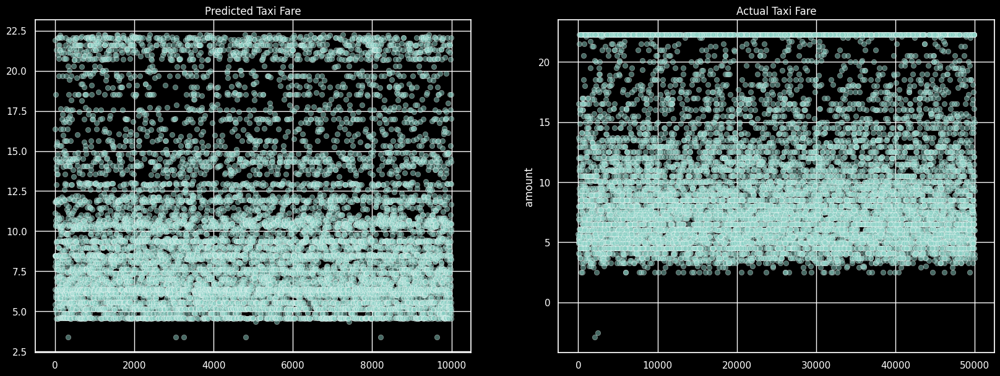

In [62]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_dt_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **Bagging Regression**

#### Without Tuning

In [63]:
# Initializing and fitting untuned model
model_bg = BaggingRegressor()
model_bg.fit(X_train,Y_train)

BaggingRegressor()

In [64]:
# Predicting the target variable
y_pred_bg_test = model_bg.predict(X_test)
y_pred_bg_train = model_bg.predict(X_train)

In [65]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_bg_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_bg_test):.5f}')

Train MAE - : 0.72988
Test MAE - : 1.86975


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

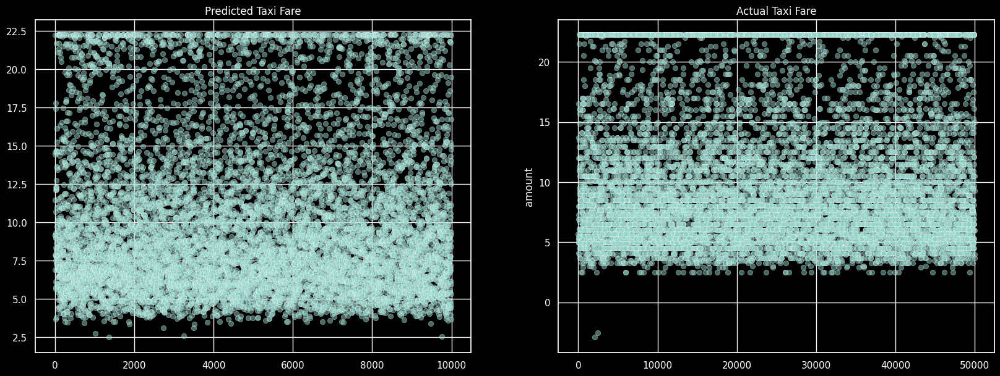

In [66]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_bg_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [67]:
param_grid_bg = {
    'n_estimators': [10, 50, 100, 200, 500, 1000],
    'max_samples': np.arange(0.1, 1.1, 0.1),
    'max_features': np.arange(0.1, 1.1, 0.1),
    'bootstrap': [True, False]
}
# Create the RandomizedSearchCV object
bg_RandomGrid = RandomizedSearchCV(model_bg,
                           param_grid_bg,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')
# Fit the grid to the data
bg_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, max_features=0.1, max_samples=0.5, n_estimators=100; total time=   5.3s
[CV] END bootstrap=False, max_features=0.1, max_samples=0.5, n_estimators=100; total time=   4.3s
[CV] END bootstrap=False, max_features=0.1, max_samples=0.5, n_estimators=100; total time=   4.3s
[CV] END bootstrap=False, max_features=0.1, max_samples=0.5, n_estimators=100; total time=   6.7s
[CV] END bootstrap=False, max_features=0.1, max_samples=0.5, n_estimators=100; total time=   4.4s
[CV] END bootstrap=False, max_features=0.6, max_samples=0.30000000000000004, n_estimators=100; total time=   4.2s
[CV] END bootstrap=False, max_features=0.6, max_samples=0.30000000000000004, n_estimators=100; total time=   5.0s
[CV] END bootstrap=False, max_features=0.6, max_samples=0.30000000000000004, n_estimators=100; total time=   4.2s
[CV] END bootstrap=False, max_features=0.6, max_samples=0.30000000000000004, n_estimators=100; total time= 

RandomizedSearchCV(cv=5, estimator=BaggingRegressor(),
                   param_distributions={'bootstrap': [True, False],
                                        'max_features': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'max_samples': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'n_estimators': [10, 50, 100, 200, 500,
                                                         1000]},
                   scoring='neg_mean_squared_error', verbose=2)

In [68]:
# The best values of hyperparameters
bg_RandomGrid.best_params_

{'n_estimators': 500,
 'max_samples': 0.8,
 'max_features': 1.0,
 'bootstrap': True}

In [69]:
# The best model
bg_RandomGrid.best_estimator_

BaggingRegressor(max_samples=0.8, n_estimators=500)

In [70]:
# Predicting the target variable
y_pred_bg_test_tuned = bg_RandomGrid.predict(X_test)
y_pred_bg_train_tuned = bg_RandomGrid.predict(X_train)

In [71]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_bg_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_bg_test_tuned):.5f}')

Train MAE - : 0.79865
Test MAE - : 1.77288


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

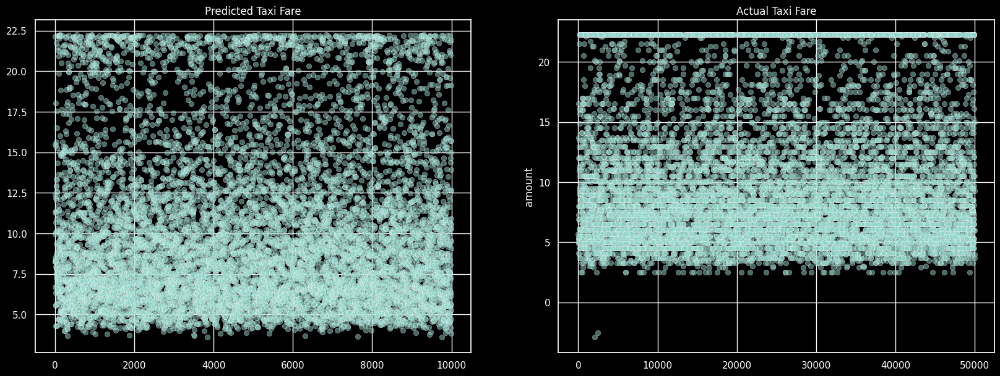

In [72]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_bg_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **AdaBoosting Regression**

#### Without Tuning

In [73]:
# Initializing and fitting untuned model
model_ada = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())
model_ada.fit(X_train,Y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor())

In [74]:
# Predicting the target variable
y_pred_ada_test = model_ada.predict(X_test)
y_pred_ada_train = model_ada.predict(X_train)

In [75]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_ada_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_ada_test):.5f}')

Train MAE - : 0.04063
Test MAE - : 1.78029


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

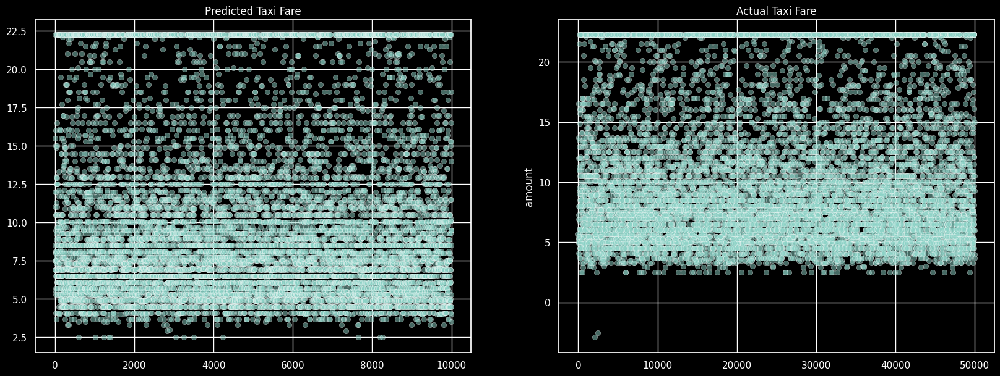

In [76]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_ada_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [77]:
param_grid_ada = {
    'n_estimators': [5, 10, 20, 30, 50],
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'loss': ['linear', 'square', 'exponential'],
    'base_estimator__max_depth': [5, 10, 15, 20],
}

# Create the RandomizedSearchCV object
ada_RandomGrid = RandomizedSearchCV(model_ada,
                           param_grid_ada,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')
# Fit the grid to the data
ada_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END base_estimator__max_depth=20, learning_rate=0.1, loss=square, n_estimators=30; total time=   6.3s
[CV] END base_estimator__max_depth=20, learning_rate=0.1, loss=square, n_estimators=30; total time=   6.2s
[CV] END base_estimator__max_depth=20, learning_rate=0.1, loss=square, n_estimators=30; total time=   5.5s
[CV] END base_estimator__max_depth=20, learning_rate=0.1, loss=square, n_estimators=30; total time=   6.1s
[CV] END base_estimator__max_depth=20, learning_rate=0.1, loss=square, n_estimators=30; total time=   5.5s
[CV] END base_estimator__max_depth=15, learning_rate=0.01, loss=exponential, n_estimators=10; total time=   1.5s
[CV] END base_estimator__max_depth=15, learning_rate=0.01, loss=exponential, n_estimators=10; total time=   1.5s
[CV] END base_estimator__max_depth=15, learning_rate=0.01, loss=exponential, n_estimators=10; total time=   1.8s
[CV] END base_estimator__max_depth=15, learning_rate=0.01, loss=e

RandomizedSearchCV(cv=5,
                   estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor()),
                   param_distributions={'base_estimator__max_depth': [5, 10, 15,
                                                                      20],
                                        'learning_rate': [0.01, 0.1, 0.5, 1.0],
                                        'loss': ['linear', 'square',
                                                 'exponential'],
                                        'n_estimators': [5, 10, 20, 30, 50]},
                   scoring='neg_mean_squared_error', verbose=2)

In [78]:
# The best values of hyperparameters
ada_RandomGrid.best_params_

{'n_estimators': 20,
 'loss': 'square',
 'learning_rate': 0.1,
 'base_estimator__max_depth': 10}

In [79]:
# The best model
ada_RandomGrid.best_estimator_

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10),
                  learning_rate=0.1, loss='square', n_estimators=20)

In [80]:
# Predicting the target variable
y_pred_ada_test_tuned = ada_RandomGrid.predict(X_test)
y_pred_ada_train_tuned = ada_RandomGrid.predict(X_train)

In [81]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_ada_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_ada_test_tuned):.5f}')

Train MAE - : 1.63627
Test MAE - : 1.74786


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

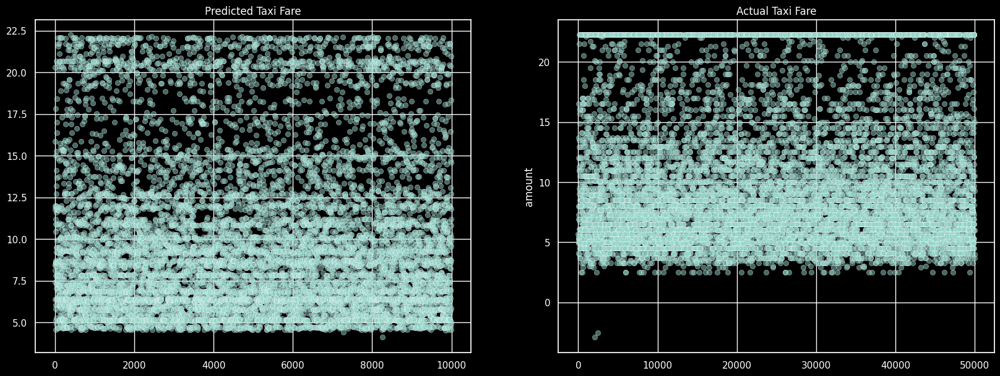

In [82]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_ada_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **Gradient Boosting Regression**

#### Without Tuning

In [83]:
# Initializing and fitting untuned model
model_gb = GradientBoostingRegressor()
model_gb.fit(X_train,Y_train)

GradientBoostingRegressor()

In [84]:
# Predicting the target variable
y_pred_gb_test = model_gb.predict(X_test)
y_pred_gb_train = model_gb.predict(X_train)

In [85]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_gb_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_gb_test):.5f}')

Train MAE - : 1.67254
Test MAE - : 1.69931


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

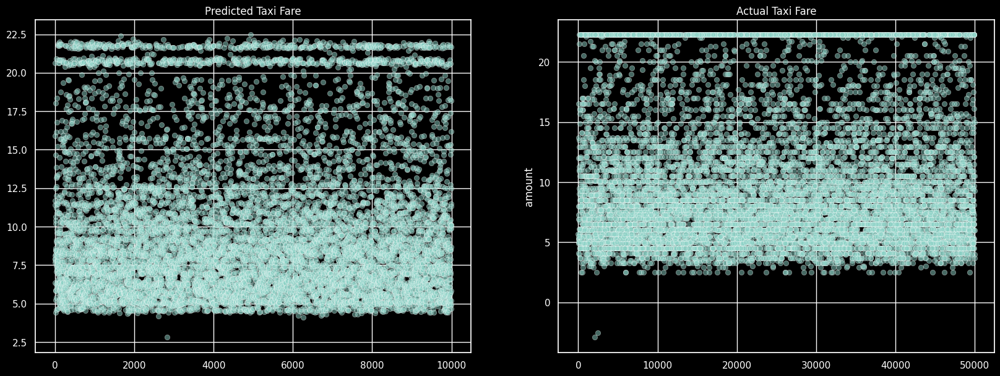

In [86]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_gb_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [87]:
param_grid_gb = {
    'n_estimators': [10, 50, 100, 200, 500, 1000],
    'max_depth': np.arange(1, 11),
    'learning_rate': np.arange(0.01, 1.1, 0.1),
    'max_features': np.arange(0.1, 1.1, 0.1),
    'subsample': np.arange(0.1, 1.1, 0.1),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
}

# Create the RandomizedSearchCV object
gb_RandomGrid = RandomizedSearchCV(model_gb,
                           param_grid_gb,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')
# Fit the grid to the data
gb_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END learning_rate=0.91, max_depth=3, max_features=0.1, min_samples_leaf=10, min_samples_split=2, n_estimators=10, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.91, max_depth=3, max_features=0.1, min_samples_leaf=10, min_samples_split=2, n_estimators=10, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.91, max_depth=3, max_features=0.1, min_samples_leaf=10, min_samples_split=2, n_estimators=10, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.91, max_depth=3, max_features=0.1, min_samples_leaf=10, min_samples_split=2, n_estimators=10, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.91, max_depth=3, max_features=0.1, min_samples_leaf=10, min_samples_split=2, n_estimators=10, subsample=0.9; total time=   0.2s
[CV] END learning_rate=0.11, max_depth=7, max_features=0.1, min_samples_leaf=9, min_samples_split=5, n_estimators=10, subsample=0.5; total time=   0.2s
[CV] END learning_rate

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                   param_distributions={'learning_rate': array([0.01, 0.11, 0.21, 0.31, 0.41, 0.51, 0.61, 0.71, 0.81, 0.91, 1.01]),
                                        'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'max_features': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': [10, 50, 100, 200, 500,
                                                         1000],
                                        'subsample': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
                   scoring='neg_mean_squared_error', verbose=2)

In [88]:
# The best values of hyperparameters
gb_RandomGrid.best_params_

{'subsample': 0.5,
 'n_estimators': 500,
 'min_samples_split': 10,
 'min_samples_leaf': 5,
 'max_features': 0.9,
 'max_depth': 6,
 'learning_rate': 0.01}

In [89]:
# The best model
gb_RandomGrid.best_estimator_

GradientBoostingRegressor(learning_rate=0.01, max_depth=6, max_features=0.9,
                          min_samples_leaf=5, min_samples_split=10,
                          n_estimators=500, subsample=0.5)

In [90]:
# Predicting the target variable
y_pred_gb_test_tuned = gb_RandomGrid.predict(X_test)
y_pred_gb_train_tuned = gb_RandomGrid.predict(X_train)

In [91]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_gb_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_gb_test_tuned):.5f}')

Train MAE - : 1.63316
Test MAE - : 1.69905


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

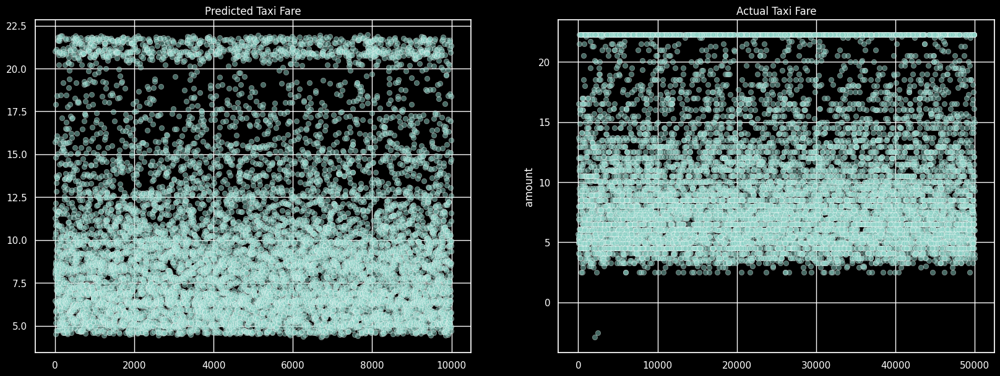

In [92]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_gb_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

### **Random Forest Regression**

#### Without Tuning

In [93]:
# Initializing and fitting untuned model
model_rf = RandomForestRegressor()
model_rf.fit(X_train,Y_train)

RandomForestRegressor()

In [94]:
# Predicting the target variable
y_pred_rf_test = model_rf.predict(X_test)
y_pred_rf_train = model_rf.predict(X_train)

In [95]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_rf_train):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_rf_test):.5f}')

Train MAE - : 0.66409
Test MAE - : 1.78635


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

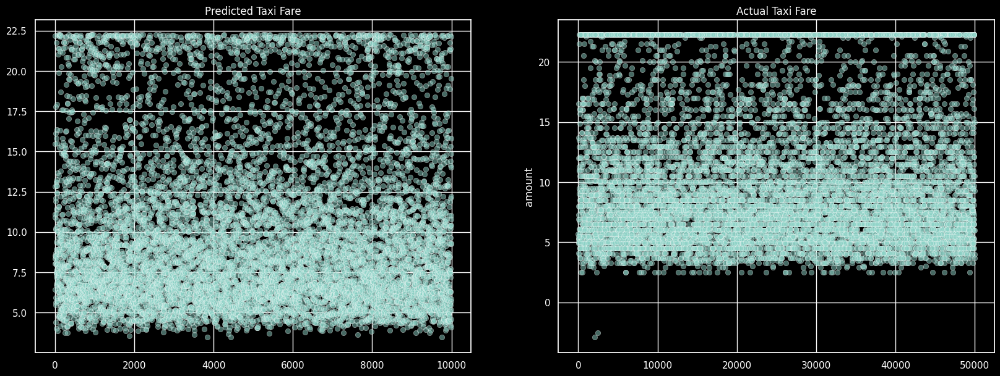

In [96]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_rf_test,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)

#### With Tuning

In [97]:
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [30, 50, 60, 100],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
     'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Create the RandomizedSearchCV object
rf_RandomGrid = RandomizedSearchCV(model_rf,
                           param_grid_rf,
                           cv=5,
                           verbose=2,
                           scoring='neg_mean_squared_error')
# Fit the grid to the data
rf_RandomGrid.fit(X_train,Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   7.5s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   6.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   7.3s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   7.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   6.7s
[CV] END bootstrap=True, max_depth=60, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=  13.8s
[CV] END bootstrap=True, max_depth=60, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200;

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [30, 50, 60, 100],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200]},
                   scoring='neg_mean_squared_error', verbose=2)

In [98]:
# The best values of hyperparameters
rf_RandomGrid.best_params_

{'n_estimators': 200,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'log2',
 'max_depth': 60,
 'bootstrap': True}

In [99]:
# The best model
rf_RandomGrid.best_estimator_

RandomForestRegressor(max_depth=60, max_features='log2', min_samples_split=10,
                      n_estimators=200)

In [100]:
# Predicting the target variable
y_pred_rf_test_tuned = rf_RandomGrid.predict(X_test)
y_pred_rf_train_tuned = rf_RandomGrid.predict(X_train)

In [101]:
#Evaluating model performance
print(f'Train MAE - : {mean_absolute_error(Y_train, y_pred_rf_train_tuned):.5f}')
print(f'Test MAE - : {mean_absolute_error(Y_test, y_pred_rf_test_tuned):.5f}')

Train MAE - : 1.10546
Test MAE - : 1.74060


<Axes: title={'center': 'Actual Taxi Fare'}, ylabel='amount'>

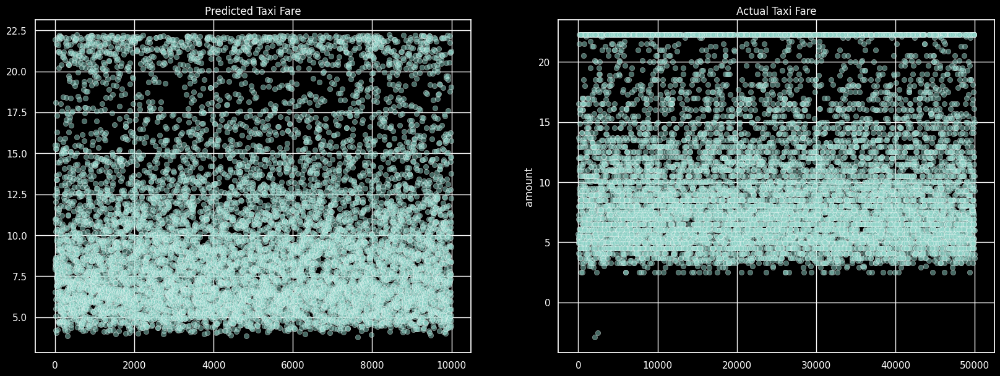

In [102]:
# Comparing predictions with actual values
fig,axes = plt.subplots(1,2,figsize=(20,7))
plt.subplot(1,2,1)
plt.title('Predicted Taxi Fare')
sns.scatterplot(y_pred_rf_test_tuned,alpha=0.5)
plt.subplot(1,2,2)
plt.title('Actual Taxi Fare')
sns.scatterplot(Y_test,alpha=0.5)